Trabajo Final - DATA SCIENCE

In [148]:
#librerias
import pandas as pd
import numpy as np
import seaborn as sns
import chart_studio as py
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn import metrics
import json
import matplotlib.pyplot as plt

1. EXPLORACIÓN DE LOS DATOS

1.1. Carga de datos

In [149]:
#Carga del archivo csv
df_videos = pd.read_csv('USvideos_cc50_202101.csv')

#Carga del archivo json
with open('US_category_id.json', 'r') as f:
    category_data = json.load(f)

#Diccionario de categorias
categories = {item['id']: item['snippet']['title'] for
              item in category_data['items']}

1.2. Inspección de datos

In [75]:
#Mostrar las primeras 5 filas
df_videos.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,state,lat,lon,geometry
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,Utah,39.419220,-111.950684,POINT (-111.950684 39.41922)
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Nevada,39.876019,-117.224121,POINT (-117.224121 39.876019)
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Delaware,39.000000,-75.500000,POINT (-75.5 39)
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,Delaware,39.000000,-75.500000,POINT (-75.5 39)
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Michigan,44.182205,-84.506836,POINT (-84.50683600000001 44.182205)


In [76]:
#Mostrar las columnas
df_videos.columns

Index(['video_id', 'trending_date', 'title', 'channel_title', 'category_id',
       'publish_time', 'tags', 'views', 'likes', 'dislikes', 'comment_count',
       'thumbnail_link', 'comments_disabled', 'ratings_disabled',
       'video_error_or_removed', 'description', 'state', 'lat', 'lon',
       'geometry'],
      dtype='object')

In [77]:
#Información del dataset
df_videos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40949 entries, 0 to 40948
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   video_id                40949 non-null  object 
 1   trending_date           40949 non-null  object 
 2   title                   40949 non-null  object 
 3   channel_title           40949 non-null  object 
 4   category_id             40949 non-null  int64  
 5   publish_time            40949 non-null  object 
 6   tags                    40949 non-null  object 
 7   views                   40949 non-null  int64  
 8   likes                   40949 non-null  int64  
 9   dislikes                40949 non-null  int64  
 10  comment_count           40949 non-null  int64  
 11  thumbnail_link          40949 non-null  object 
 12  comments_disabled       40949 non-null  bool   
 13  ratings_disabled        40949 non-null  bool   
 14  video_error_or_removed  40949 non-null

In [78]:
#Estadisticas del dataset
df_videos.describe()

,category_id,views,likes,dislikes,comment_count,lat,lon
count,40949.000000,4.094900e+04,4.094900e+04,4.094900e+04,4.094900e+04,40949.000000,40949.000000
mean,19.972429,2.360785e+06,7.426670e+04,3.711401e+03,8.446804e+03,39.660944,-93.741838
std,7.568327,7.394114e+06,2.288853e+05,2.902971e+04,3.743049e+04,6.589701,19.034596
min,1.000000,5.490000e+02,0.000000e+00,0.000000e+00,0.000000e+00,19.741755,-155.844437
25%,17.000000,2.423290e+05,5.424000e+03,2.020000e+02,6.140000e+02,35.860119,-105.358887
50%,24.000000,6.818610e+05,1.809100e+04,6.310000e+02,1.856000e+03,39.833851,-90.000000
75%,25.000000,1.823157e+06,5.541700e+04,1.938000e+03,5.755000e+03,44.000000,-80.500000
max,43.000000,2.252119e+08,5.613827e+06,1.674420e+06,1.361580e+06,66.160507,-68.972168


In [79]:
#Mostrar las categorias
print(categories)

{'1': 'Film & Animation', '2': 'Autos & Vehicles', '10': 'Music', '15': 'Pets & Animals', '17': 'Sports', '18': 'Short Movies', '19': 'Travel & Events', '20': 'Gaming', '21': 'Videoblogging', '22': 'People & Blogs', '23': 'Comedy', '24': 'Entertainment', '25': 'News & Politics', '26': 'Howto & Style', '27': 'Education', '28': 'Science & Technology', '29': 'Nonprofits & Activism', '30': 'Movies', '31': 'Anime/Animation', '32': 'Action/Adventure', '33': 'Classics', '34': 'Comedy', '35': 'Documentary', '36': 'Drama', '37': 'Family', '38': 'Foreign', '39': 'Horror', '40': 'Sci-Fi/Fantasy', '41': 'Thriller', '42': 'Shorts', '43': 'Shows', '44': 'Trailers'}


1.3. Visualización de los datos

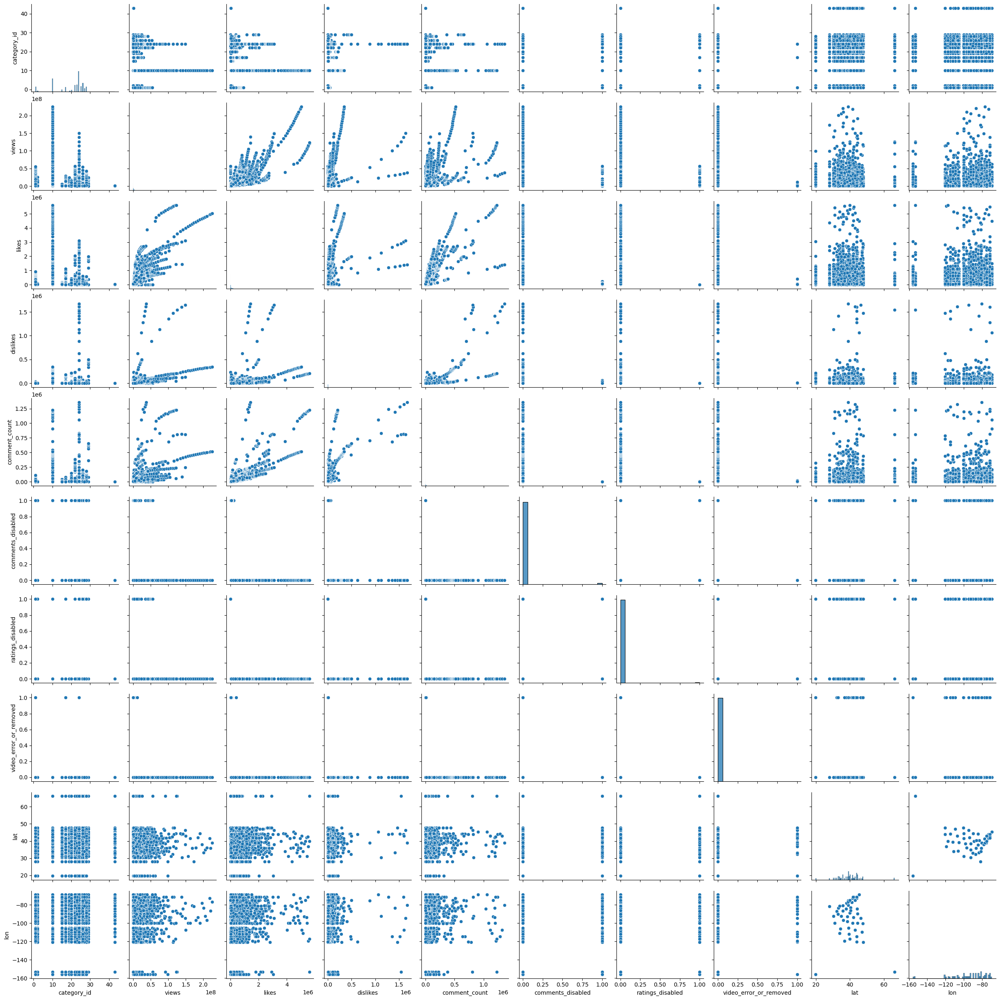

In [80]:
#Grafico de la relacion entre las variables
sns.pairplot(df_videos)

Text(0.5, 0.98, 'Relación entre Vistas y Likes en Videos de YouTube')

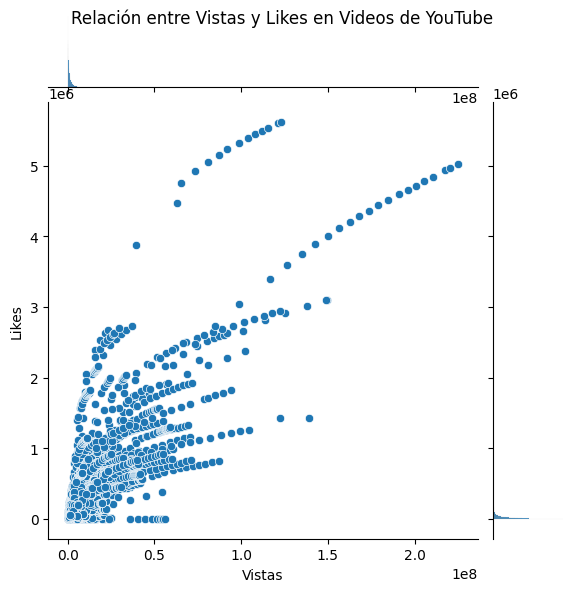

In [81]:
#Relacion entre las vistas y los likes
joint_plot = sns.jointplot(x='views', y='likes', data=df_videos)
joint_plot.set_axis_labels("Vistas", "Likes")

joint_plot.fig.suptitle("Relación entre Vistas y Likes en Videos de YouTube")

Text(0.5, 0.98, 'Relación entre Vistas y Dislikes en Videos de YouTube')

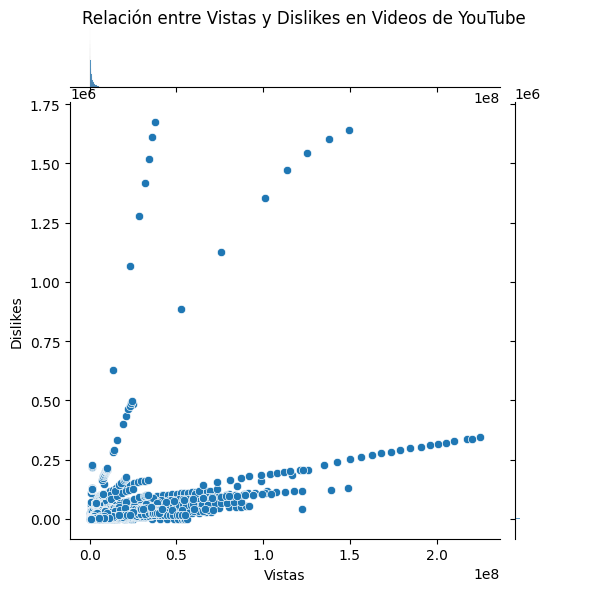

In [82]:
#Relacion entre las vistas y los dislikes
joint_plot = sns.jointplot(x='views', y='dislikes', data=df_videos)
joint_plot.set_axis_labels("Vistas", "Dislikes")

joint_plot.fig.suptitle("Relación entre Vistas y Dislikes en Videos de YouTube")

Text(0.5, 0.98, 'Relación entre Vistas y Comentarios en Videos de YouTube')

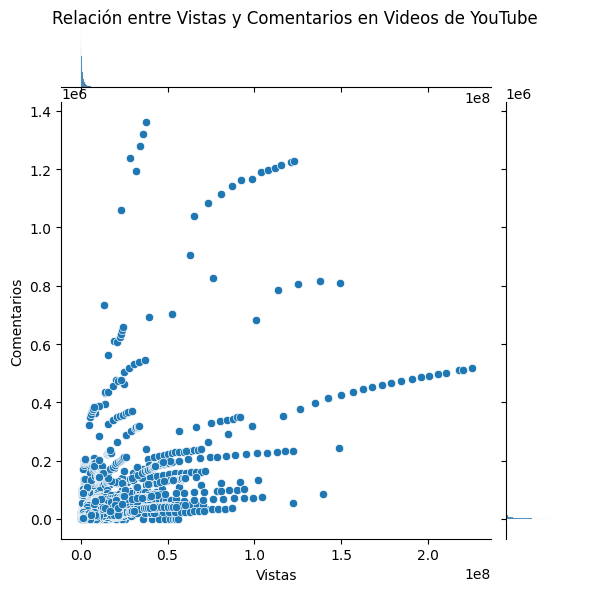

In [83]:
#Relacion entre las vistas y los comentarios
joint_plot = sns.jointplot(x='views', y='comment_count', data=df_videos)
joint_plot.set_axis_labels("Vistas", "Comentarios")

joint_plot.fig.suptitle("Relación entre Vistas y Comentarios en Videos de YouTube")

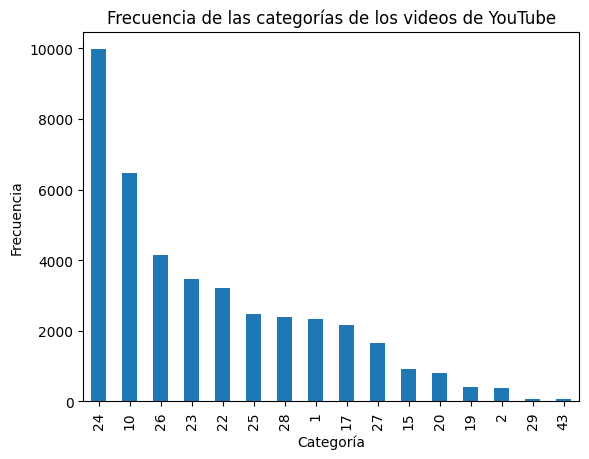

In [84]:
#Grafico de la frecuencia de las categorias
df_videos['category_id'].value_counts().plot(kind='bar')
plt.title('Frecuencia de las categorías de los videos de YouTube')
plt.xlabel('Categoría')
plt.ylabel('Frecuencia')
plt.show()

#Categoria id 24 -> "Entertainment"

2. CALIDAD DE LOS DATOS

In [150]:
#Verificar si hay valores nulos
df_videos.isnull().sum()

video_id                    0
trending_date               0
title                       0
channel_title               0
category_id                 0
publish_time                0
tags                        0
views                       0
likes                       0
dislikes                    0
comment_count               0
thumbnail_link              0
comments_disabled           0
ratings_disabled            0
video_error_or_removed      0
description               570
state                       0
lat                         0
lon                         0
geometry                    0
dtype: int64

In [86]:
#Verificar si hay valores duplicados
df_videos.duplicated().sum()

1

In [87]:
#Eliminar valores duplicados
df_videos.drop_duplicates(inplace=True)

In [88]:
#Verificar si hay valores atipicos en las vistas

#Calculo de los cuartiles
Q1 = df_videos['views'].quantile(0.25)
Q3 = df_videos['views'].quantile(0.75)

#Calculo del rango intercuartilico
IQR = Q3 - Q1

#Calculo de los limites
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

#Filtrar los valores atipicos
outliers = df_videos[(df_videos['views'] < lower_bound) | (df_videos['views'] > upper_bound)]

#Mostrar los valores atipicos
print(outliers)


          video_id trending_date  \
32     n1WpP7iowLc      17.14.11   
53     9t9u_yPEidY      17.14.11   
69     Jw1Y-zhQURU      17.14.11   
70     2Vv-BfVoq4g      17.14.11   
104    pz95u3UVpaM      17.14.11   
...            ...           ...   
40941  7UoP9ABJXGE      18.14.06   
40942  ju_inUnrLc4      18.14.06   
40943  1PhPYr_9zRY      18.14.06   
40947  oV0zkMe1K8s      18.14.06   
40948  ooyjaVdt-jA      18.14.06   

                                                   title  \
32            Eminem - Walk On Water (Audio) ft. Beyoncé   
53     Jennifer Lopez - Amor, Amor, Amor (Official Vi...   
69         John Lewis Christmas Ad 2017 - #MozTheMonster   
70           Ed Sheeran - Perfect (Official Music Video)   
104    Camila Cabello - Havana (Vertical Video) ft. Y...   
...                                                  ...   
40941            Dan + Shay - Speechless (Wedding Video)   
40942              Fifth Harmony - Don't Say You Love Me   
40943  BTS Plays With Puppi

In [89]:
#Verificar si hay valores atipicos en los likes

#Calculo de los cuartiles
Q1 = df_videos['likes'].quantile(0.25)
Q3 = df_videos['likes'].quantile(0.75)

#Calculo del rango intercuartilico
IQR = Q3 - Q1

#Calculo de los limites
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

#Filtrar los valores atipicos
outliers = df_videos[(df_videos['likes'] < lower_bound) | (df_videos['likes'] > upper_bound)]

#Mostrar los valores atipicos
print(outliers)


          video_id trending_date  \
2      5qpjK5DgCt4      17.14.11   
4      d380meD0W0M      17.14.11   
32     n1WpP7iowLc      17.14.11   
53     9t9u_yPEidY      17.14.11   
70     2Vv-BfVoq4g      17.14.11   
...            ...           ...   
40939  pcJo0tIWybY      18.14.06   
40942  ju_inUnrLc4      18.14.06   
40943  1PhPYr_9zRY      18.14.06   
40947  oV0zkMe1K8s      18.14.06   
40948  ooyjaVdt-jA      18.14.06   

                                                   title  \
2      Racist Superman | Rudy Mancuso, King Bach & Le...   
4                               I Dare You: GOING BALD!?   
32            Eminem - Walk On Water (Audio) ft. Beyoncé   
53     Jennifer Lopez - Amor, Amor, Amor (Official Vi...   
70           Ed Sheeran - Perfect (Official Music Video)   
...                                                  ...   
40939    SZA - Garden (Say It Like Dat) (Official Video)   
40942              Fifth Harmony - Don't Say You Love Me   
40943  BTS Plays With Puppi

3. PREPARACIÓN DE LOS DATOS

3.1. Limpieza de datos

In [151]:
#Completar los valores nulos de la columna "description" con "No description"
df_videos['description'].fillna('No description', inplace=True)

C:\Users\Ryzen\AppData\Local\Temp\ipykernel_28144\304012273.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [152]:
df_videos.isnull().sum()

video_id                  0
trending_date             0
title                     0
channel_title             0
category_id               0
publish_time              0
tags                      0
views                     0
likes                     0
dislikes                  0
comment_count             0
thumbnail_link            0
comments_disabled         0
ratings_disabled          0
video_error_or_removed    0
description               0
state                     0
lat                       0
lon                       0
geometry                  0
dtype: int64

3.2. Pre-Procesamientos de los datos

In [153]:
#Tratamiento de los valores atipicos
#Formula del rango intercuartilico
def remove_outliers(df, column):
    mediana = df[column].median()
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df[column] = df[column].apply(lambda x: mediana if x < lower_bound or x > upper_bound else x)
    return df[column]

In [155]:
#Reemplazar los valores atipicos

df_videos['views'] = remove_outliers(df_videos, 'views') 
df_videos['likes'] = remove_outliers(df_videos, 'likes')
df_videos['dislikes'] = remove_outliers(df_videos, 'dislikes')
df_videos['comment_count'] = remove_outliers(df_videos, 'comment_count')

#Reemplazar los valores 0 con la media
df_videos['views'] = df_videos['views'].replace(0, df_videos['views'].mean())
df_videos['likes'] = df_videos['likes'].replace(0, df_videos['likes'].mean())
df_videos['dislikes'] = df_videos['dislikes'].replace(0, df_videos['dislikes'].mean())
df_videos['comment_count'] = df_videos['comment_count'].replace(0, df_videos['comment_count'].mean())

3.3 Construcción de nuevos datos

Se crearán nuevas columnas a partir de las existentes si es necesario

4. REQUERIMIENTOS

LISTA DE PREGUNTAS

Por categoría de videos

- ¿Qué categorías de videos son las de mayor tendencia?

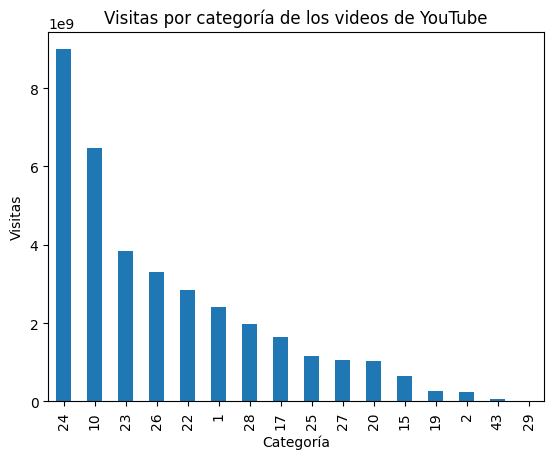

In [94]:
#Gráfico de visitas por categoria
views_by_category = df_videos.groupby('category_id')['views'].sum().sort_values(ascending=False)
views_by_category.plot(kind='bar')
plt.title('Visitas por categoría de los videos de YouTube')
plt.xlabel('Categoría')
plt.ylabel('Visitas')
plt.show()


- ¿Qué categorías de videos son los que más gustan? ¿Y las que menos gustan?

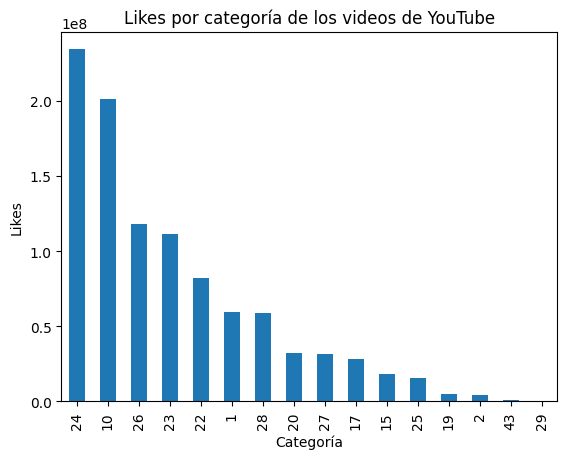

In [95]:
#Gráfico de likes por categoria
likes_by_category = df_videos.groupby('category_id')['likes'].sum().sort_values(ascending=False)
likes_by_category.plot(kind='bar')
plt.title('Likes por categoría de los videos de YouTube')
plt.xlabel('Categoría')
plt.ylabel('Likes')
plt.show()

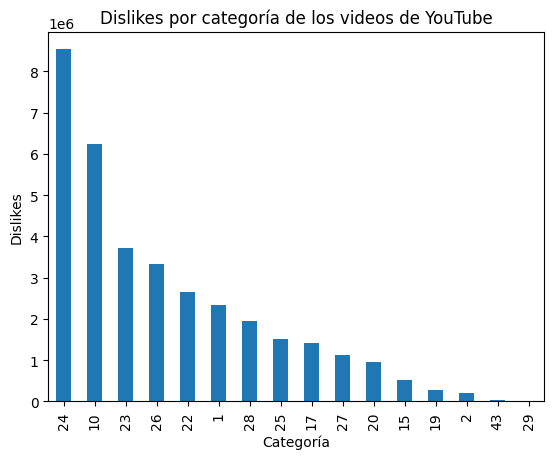

In [96]:
#Gráfico de dislikes por categoria
dislikes_by_category = df_videos.groupby('category_id')['dislikes'].sum().sort_values(ascending=False)
dislikes_by_category.plot(kind='bar')
plt.title('Dislikes por categoría de los videos de YouTube')
plt.xlabel('Categoría')
plt.ylabel('Dislikes')
plt.show()

-  ¿Qué categorías de videos tienen la mejor proporción (ratio) de “Me gusta” / “No me 
gusta”?

In [97]:
#Categorias con la mejor proporción de likes / dislikes
df_videos['likes_dislikes_ratio'] = df_videos['likes'] / df_videos['dislikes']

category_by_ratio_mean = pd.DataFrame({
    "category_id": [100], 
    "ratio_mean": [0.0],
    "nVideos": [1]
})

for index, row in df_videos.iterrows():
    #print("hola")
    if len(category_by_ratio_mean[category_by_ratio_mean['category_id'] == row['category_id'] ].values) == 0:
        xd = {'category_id': row['category_id'], 'ratio_mean': row['likes_dislikes_ratio'], 'nVideos': 1}
        category_by_ratio_mean.loc[len(category_by_ratio_mean)] = [row['category_id'], row['likes_dislikes_ratio'], 1]
    else:
        ratio_mean = (category_by_ratio_mean.loc[category_by_ratio_mean['category_id'] == row['category_id']]['ratio_mean'])
        nValues = (category_by_ratio_mean.loc[category_by_ratio_mean['category_id'] == row['category_id']]['nVideos'])
        newMean = (ratio_mean/((nValues+1)/nValues) + (row['likes_dislikes_ratio']/(nValues+1)))
        category_by_ratio_mean.loc[category_by_ratio_mean.index[category_by_ratio_mean['category_id'] == row['category_id']],'ratio_mean'] = newMean
        category_by_ratio_mean.loc[category_by_ratio_mean.index[category_by_ratio_mean['category_id'] == row['category_id']],'nVideos'] = nValues+1


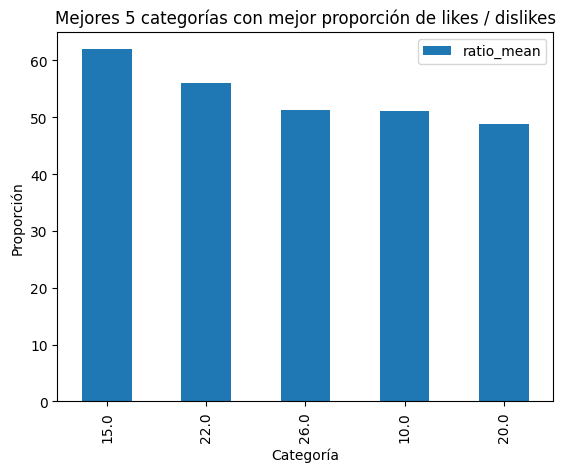

In [98]:
#Grafico de las mejores 5 categorias con mejor propocion de likes / dislikes
best = category_by_ratio_mean.sort_values(by='ratio_mean', ascending=False).head(5)

best.plot(kind='bar', x='category_id', y='ratio_mean')
plt.title('Mejores 5 categorías con mejor proporción de likes / dislikes')
plt.xlabel('Categoría')
plt.ylabel('Proporción')
plt.show()


- ¿Qué categorías de videos tienen la mejor proporción (ratio) de “Vistas” / 
“Comentarios”?

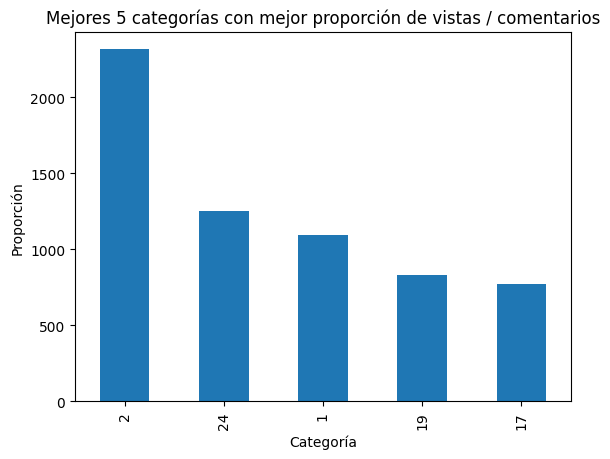

In [99]:
#Categorias con laa mejores 5 proporción de vistas / comentarios
df_videos['views_comment_ratio'] = df_videos['views'] / df_videos['comment_count']
best = df_videos.groupby('category_id')['views_comment_ratio'].mean().sort_values(ascending=False).head(5)

best.plot(kind='bar')
plt.title('Mejores 5 categorías con mejor proporción de vistas / comentarios')
plt.xlabel('Categoría')
plt.ylabel('Proporción')
plt.show()



Por el tiempo transcurrido

- ¿Cómo ha cambiado el volumen de los videos en tendencia a lo largo del tiempo?

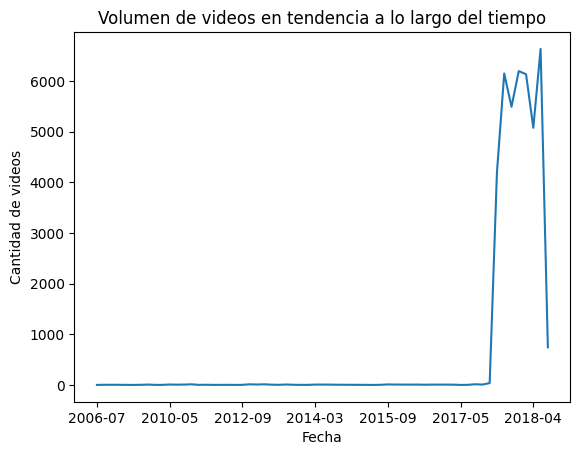

In [100]:
df_videos['publish_time'] = pd.to_datetime(df_videos['publish_time'])
df_videos['year_month'] = df_videos['publish_time'].dt.strftime('%Y-%m')

videos_by_month = df_videos.groupby('year_month').size()
videos_by_month.plot()
plt.title('Volumen de videos en tendencia a lo largo del tiempo')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de videos')
plt.show()

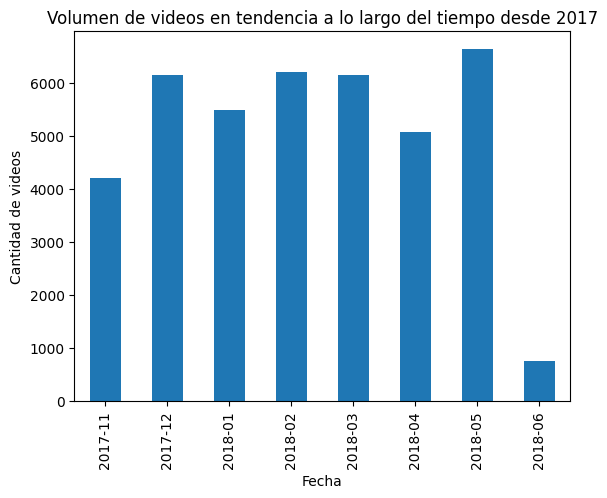

In [101]:
#Como ha cambiado el volumen de los videos en tendencia a lo largo del tiempo desde 2017
videos_by_month = df_videos[df_videos['year_month'] >= '2017-11'].groupby('year_month').size()
videos_by_month.plot(kind='bar')
plt.title('Volumen de videos en tendencia a lo largo del tiempo desde 2017')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de videos')
plt.show()

Por canales de Youtube

-  ¿Qué Canales de YouTube son tendencia más frecuentemente? ¿Y cuáles con menos 
frecuencia?


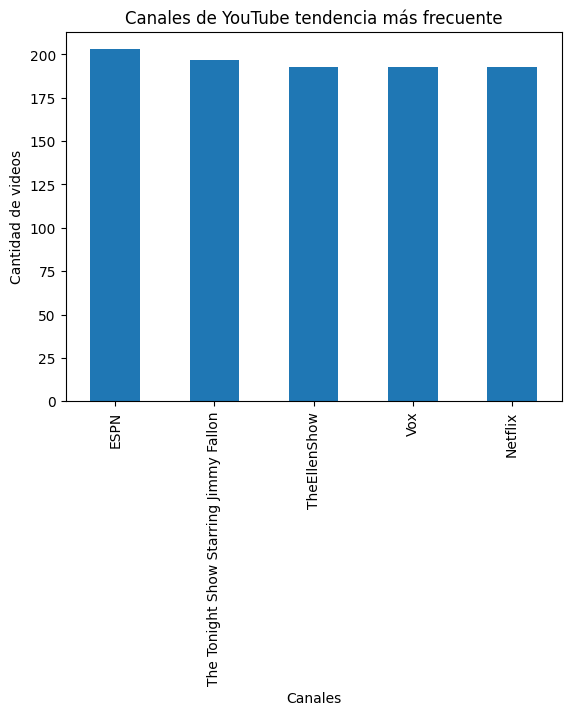

In [102]:
#Canales de YouTube tendencia más frecuentemente
trending_channels = df_videos['channel_title'].value_counts().sort_values(ascending=False).head(5)
trending_channels.plot(kind='bar')
plt.title('Canales de YouTube tendencia más frecuente')
plt.xlabel('Canales')
plt.ylabel('Cantidad de videos')
plt.show()


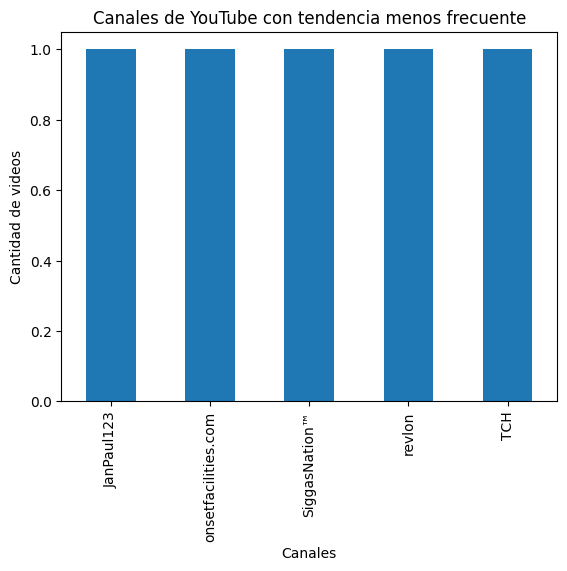

In [103]:

#Canales con tendencia menos frecuente
channels = df_videos['channel_title'].value_counts().sort_values(ascending=True).head(5)
channels.plot(kind='bar')
plt.title('Canales de YouTube con tendencia menos frecuente')
plt.xlabel('Canales')
plt.ylabel('Cantidad de videos')
plt.show()

Por geografía del país

- ¿En qué Estados se presenta el mayor número de “Vistas”, “Me gusta” y “No me gusta”? 

In [157]:
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode

# Inicializar el modo notebook para visualización
init_notebook_mode(connected=True)

data = go.Scattergeo(
    lon=df_videos['lon'],
    lat=df_videos['lat'],
    text=df_videos.apply(lambda row: f"{row['state']}<br>Lon: {row['lon']}<br>Lat: {row['lat']}<br>Vistas: {row['views']}", axis=1),
    marker=dict(
        size=df_videos['views'] / 100000, 
        color=df_videos['views'],  
        colorscale='Viridis',  
        colorbar=dict(title='Vistas')
    )
)

layout = dict(
    geo=dict(
        scope='usa',  
        showland=True,
    )
)


fig = go.Figure(data=[data], layout=layout)


iplot(fig)

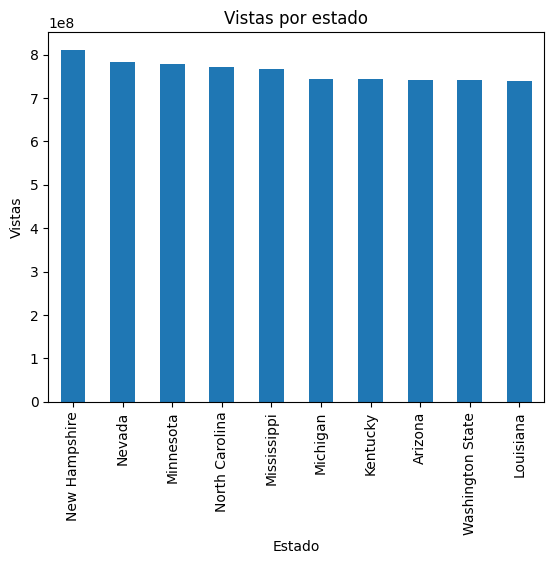

In [105]:
#Vistas por estado
views_by_state = df_videos.groupby('state')['views'].sum().sort_values(ascending=False).nlargest(10)
views_by_state.plot(kind='bar')
plt.title('Vistas por estado')
plt.xlabel('Estado')
plt.ylabel('Vistas')
plt.show()

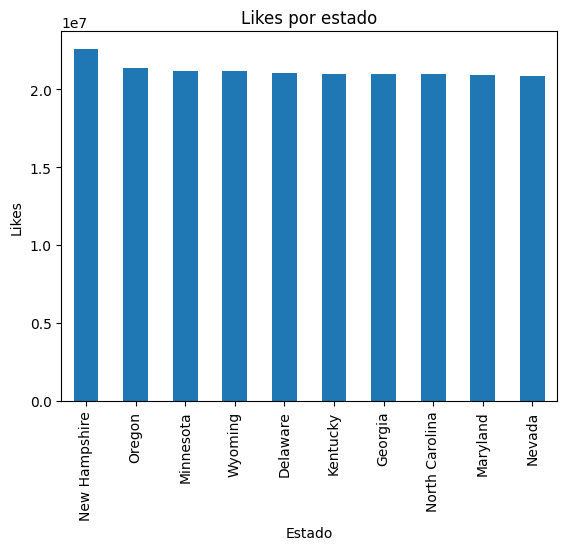

In [106]:
#Likes por estado
likes_by_state = df_videos.groupby('state')['likes'].sum().sort_values(ascending=False).nlargest(10)
likes_by_state.plot(kind='bar')
plt.title('Likes por estado')
plt.xlabel('Estado')
plt.ylabel('Likes')
plt.show()


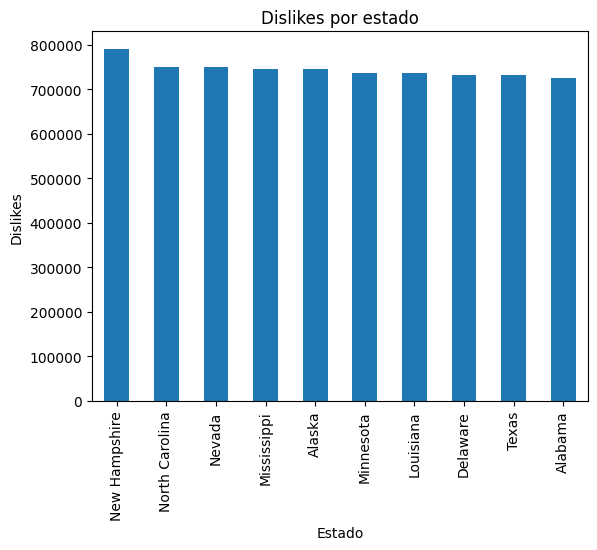

In [107]:
#Dislikes por estado
dislikes_by_state = df_videos.groupby('state')['dislikes'].sum().sort_values(ascending=False).nlargest(10)
dislikes_by_state.plot(kind='bar')
plt.title('Dislikes por estado')
plt.xlabel('Estado')
plt.ylabel('Dislikes')
plt.show()

PREGUNTAS ADICIONALES

- ¿Es factible predecir el número de “Vistas” o “Me gusta” o “No me gusta”?

In [108]:
#METRICAS -> VISTAS, LIKES, DISLIKES, COMENTARIOS

In [131]:
#Prueba con vistas
X = df_videos[['likes', 'dislikes', 'comment_count']]
y = df_videos['views']

#Modelo de regresión lineal
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [132]:
#coeficientes de las variables independientes
aux_df = pd.DataFrame(model.coef_, X.columns, columns=['Coeficiente'])
print(aux_df)

               Coeficiente
likes            10.824767
dislikes        291.102132
comment_count    58.470679


Text(0, 0.5, 'Predicted Y')

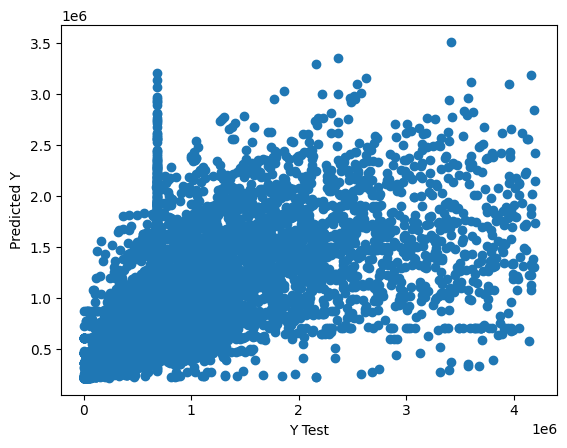

In [133]:
#Predicciones
predictions = model.predict(X_test)

#Grafico de las predicciones
plt.scatter(y_test, predictions)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')

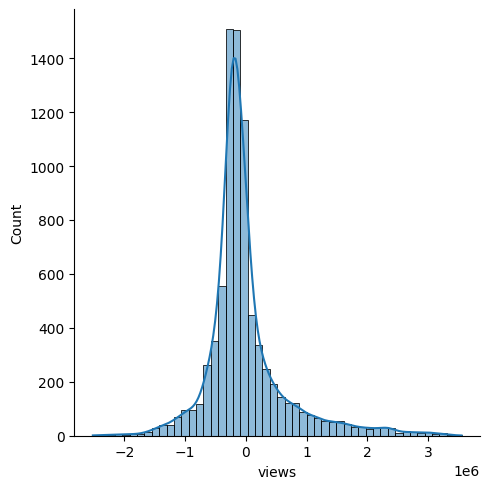

In [134]:
sns.displot((y_test - predictions), bins=50, kde=True)

In [136]:
#Metricas
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))
#print('R2:', metrics.r2_score(y_test, predictions))


MAE: 430658.5536791567
MSE: 439801032995.8365
RMSE: 663174.964090048


In [137]:
#Prueba con likes
X = df_videos[['views', 'dislikes', 'comment_count']]
y = df_videos['likes']

#Modelo de regresión lineal
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [138]:
#coeficientes de las variables independientes
aux_df = pd.DataFrame(model.coef_, X.columns, columns=['Coeficiente'])
print(aux_df)

               Coeficiente
views             0.010876
dislikes          1.468371
comment_count     3.314984


Text(0, 0.5, 'Predicted Y')

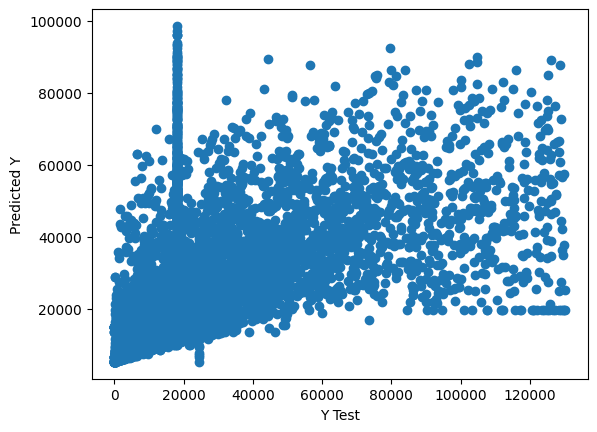

In [139]:
#Predicciones
predictions = model.predict(X_test)

#Grafico de las predicciones
plt.scatter(y_test, predictions)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')


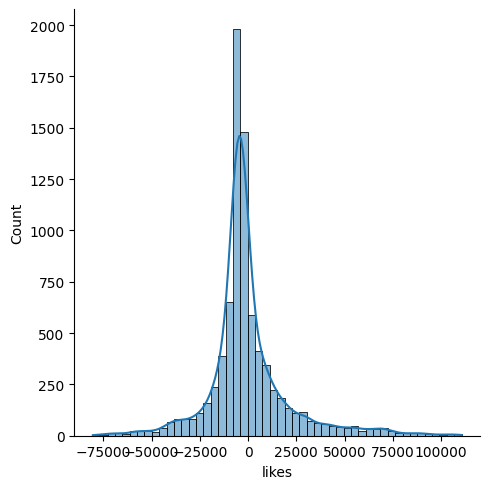

In [117]:
sns.displot((y_test - predictions), bins=50, kde=True)

In [141]:

#Metricas
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))


MAE: 13470.304012877694
MSE: 455210494.264328
RMSE: 21335.662498838137


In [142]:
#Prueba con dislikes
X = df_videos[['views', 'likes', 'comment_count']]
y = df_videos['dislikes']

#Modelo de regresión lineal
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [143]:
#coeficientes de las variables independientes
aux_df = pd.DataFrame(model.coef_, X.columns, columns=['Coeficiente'])
print(aux_df)


               Coeficiente
views             0.000357
likes             0.001793
comment_count     0.093972


Text(0, 0.5, 'Predicted Y')

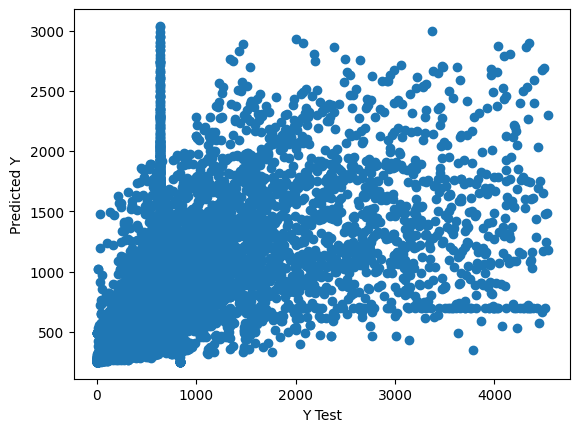

In [144]:
#Predicciones
predictions = model.predict(X_test)

#Grafico de las predicciones
plt.scatter(y_test, predictions)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')

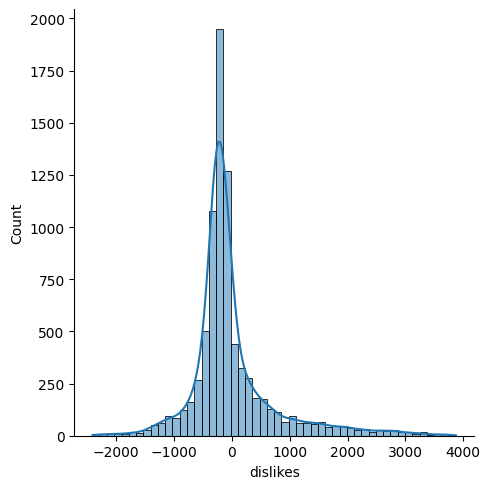

In [122]:
sns.displot((y_test - predictions), bins=50, kde=True)

In [146]:
#Metricas
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 482.0176116866879
MSE: 554630.8595150177
RMSE: 744.7354292062502


Después de realizar el modelo de regresión lineal para las variables 'views', 'likes' y 'dislikes', obtuvimos los resultados de errores de cada uno. Obtuvimos que el más factible de estos es 'dislikes' (menos error). Finalmente, podemos decir que es factible predecir el número de "No me gusta".

- ¿Los videos en tendencia son los que mayor cantidad de comentarios positivos reciben?

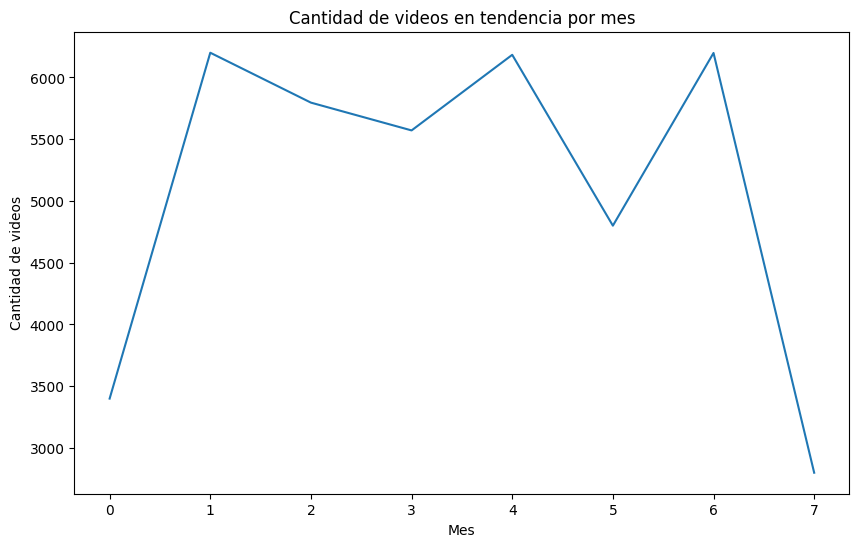

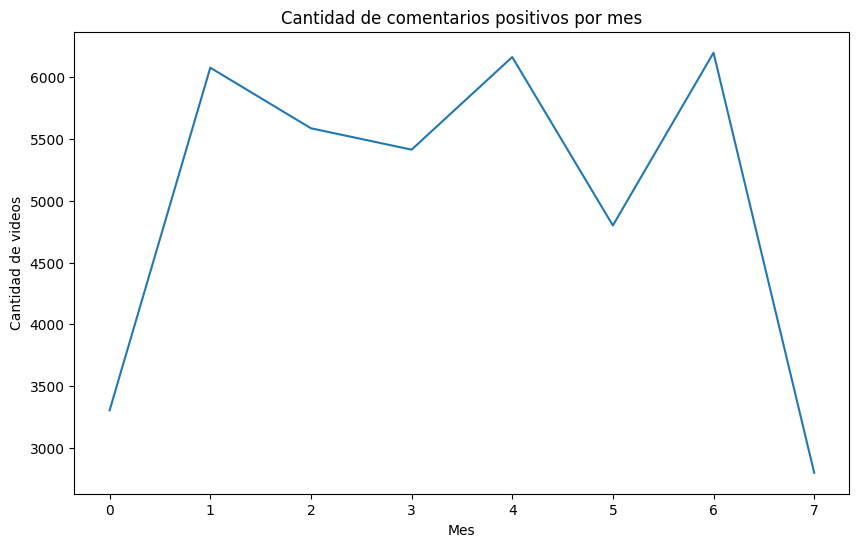

In [129]:

#Agrupar por meses y contar video en tendencia

df_videos['trending_date'] = pd.to_datetime(df_videos['trending_date'], format='%y.%d.%m')

trending_videos = df_videos.groupby([df_videos['trending_date'].dt.year.rename('year'), df_videos['trending_date'].dt.month.rename('month')])['video_id'].count().reset_index()
trending_videos.columns = ['Año', 'Mes', 'trend_videos']

positive_comments = df_videos[df_videos['likes'] > df_videos['dislikes']].groupby([df_videos['trending_date'].dt.year.rename('year'), df_videos['trending_date'].dt.month.rename('month')])['video_id'].count().reset_index()
positive_comments.columns = ['Año', 'Mes', 'positive_videos']

#Combinar los dataframes de videos en tendencia y comentarios positivos
trending_videos = trending_videos.merge(positive_comments, on=['Año', 'Mes'], how='inner').fillna(0)


#Grafico de la cantidad de videos en tendencia por mes
plt.figure(figsize=(10, 6))
plt.plot(trending_videos['trend_videos'], label='Videos en tendencia')
plt.xlabel('Mes')
plt.ylabel('Cantidad de videos')
plt.title('Cantidad de videos en tendencia por mes')
plt.show()

#Grafico de la cantidad de comentarios positivos por mes
plt.figure(figsize=(10, 6))
plt.plot(trending_videos['positive_videos'], label='Comentarios positivos')
plt.xlabel('Mes')
plt.ylabel('Cantidad de videos')
plt.title('Cantidad de comentarios positivos por mes')
plt.show()

